In [70]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from keras.models import Model
from keras.layers import Input, Dense
from keras.callbacks import ModelCheckpoint
from keras import regularizers
import matplotlib.pyplot as plt
from numpy.random import seed
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from mpl_toolkits.mplot3d import Axes3D

%matplotlib inline
%matplotlib inline
# PyOD
from tensorflow.keras import backend as k
from pyod.utils.data import generate_data
from pyod.models.auto_encoder import AutoEncoder
from keras.utils import plot_model
from pyod.utils.utility import standardizer
from pyod.models.combination import aom, moa, average, maximization

from keras.utils.vis_utils import model_to_dot 
from IPython.display import SVG
from pyod.models.abod import ABOD
from pyod.models.cblof import CBLOF
from pyod.models.feature_bagging import FeatureBagging
from pyod.models.hbos import HBOS
from pyod.models.iforest import IForest
from pyod.models.knn import KNN
from pyod.models.lof import LOF
from sklearn.mixture import GaussianMixture

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option("display.max_colwidth",None)
pd.set_option('display.width',None)

In [71]:
data = pd.read_csv('dataset.csv')

In [4]:
import gensim

In [ ]:
data['date'] = pd.to_datetime(data['Time'])
data['hour'] = data['date'].dt.hour
data['day_of_week'] = data['date'].dt.dayofweek
data['month'] = data['date'].dt.month
data['year'] = data['date'].dt.year
data['week'] = data['date'].dt.week
data['day'] = data['date'].dt.day
data['day_of_year'] = data['date'].dt.dayofyear
data.loc[data['WindNumber'].isin([1,2,3,4,6,7,8,9,10]),'radius'] = 99/2
data.loc[data['WindNumber'].isin([1,2,3,4,6,7,8,9,10]),'floorRotor'] = 8.33
data.loc[data['WindNumber'].isin([1,2,3,4,6,7,8,9,10]),'ceilRotor'] = 16.8
data.loc[data['WindNumber'].isin([1,2,3,4,6,7,8,9,10]),'inSpeed'] = 3
data.loc[data['WindNumber'].isin([1,2,3,4,6,7,8,9,10]),'outSpeed'] = 25
data.loc[data['WindNumber']==5,'radius'] = 100.5/2
data.loc[data['WindNumber']==5,'floorRotor'] = 5.5
data.loc[data['WindNumber']==5,'ceilRotor'] = 19
data.loc[data['WindNumber']==5,'inSpeed'] = 3
data.loc[data['WindNumber']==5,'outSpeed'] = 22
data.loc[data['WindNumber']==11,'radius'] = 115/2
data.loc[data['WindNumber']==11,'floorRotor'] = 5
data.loc[data['WindNumber']==11,'ceilRotor'] = 14
data.loc[data['WindNumber']==11,'inSpeed'] = 2.5
data.loc[data['WindNumber']==11,'outSpeed'] = 19
data.loc[data['WindNumber']==12,'radius'] = 104.8/2
data.loc[data['WindNumber']==12,'floorRotor'] = 5.5
data.loc[data['WindNumber']==12,'ceilRotor'] = 17
data.loc[data['WindNumber']==12,'inSpeed'] = 3
data.loc[data['WindNumber']==12,'outSpeed'] = 22
data['lineSpeed'] = data['RotorSpeed']*data['radius']/(60*data['WindSpeed'])
data['lineSpeed'].fillna(0,inplace=True)
data.loc[data['lineSpeed']==np.inf,'lineSpeed'] = 0
data.loc[data['lineSpeed']<-1000,'lineSpeed'] = 0
minmax_scaler = MinMaxScaler(feature_range=(0, 1))
std_scaler = StandardScaler()
data['ScaleWindSpeed']=None
data['ScalePower']=None
data['ScaleRotorSpeed']=None
data['ScalelineSpeed']=None
data[['ScaleWindSpeed','ScalePower','ScaleRotorSpeed','ScalelineSpeed']] = minmax_scaler.fit_transform(data[['WindSpeed','Power','RotorSpeed','lineSpeed']])


In [4]:
data_first = data.loc[(data['WindNumber']==1)]
data_2 = data.loc[(data['WindNumber']==2)]
data_3 = data.loc[(data['WindNumber']==3)]

In [ ]:
data.head()

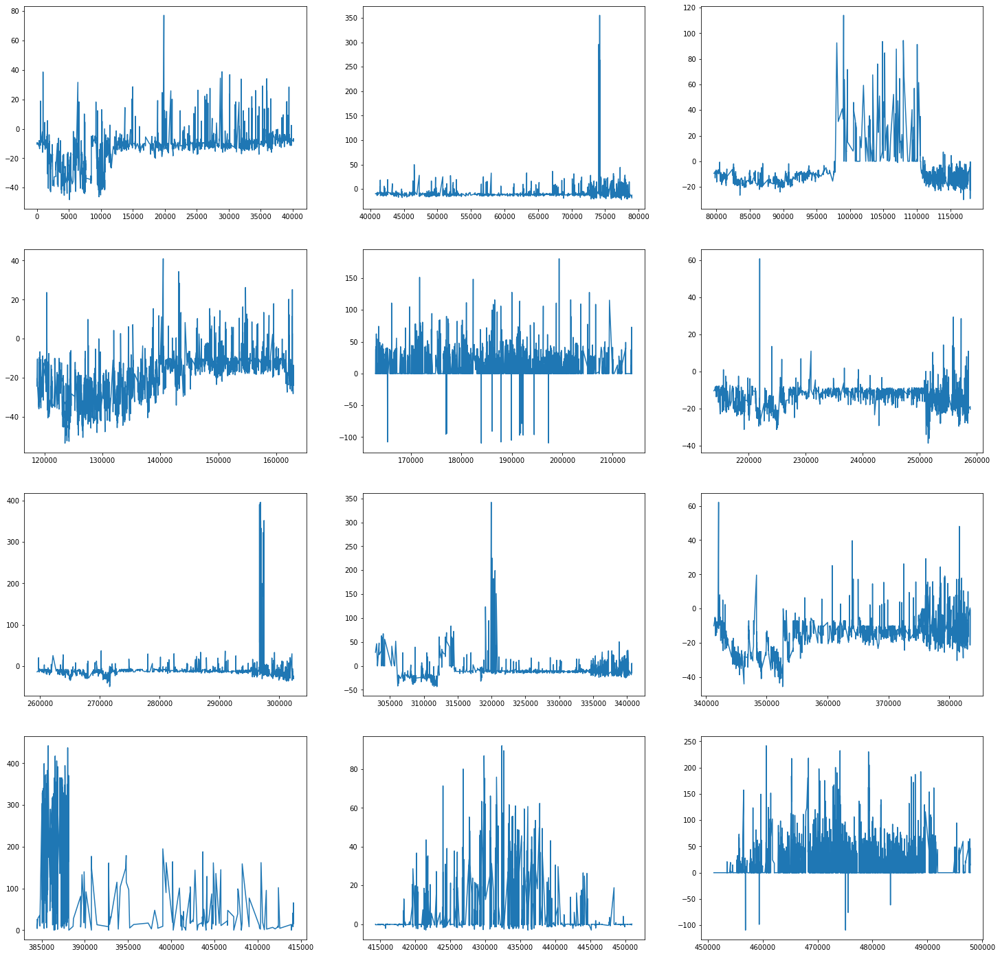

In [5]:
plt.figure(figsize=(25,25))
for i in range(1,13):
    plt.subplot(4,3,i)
    data.loc[(data['WindNumber']==i)&(data['WindSpeed']<data['inSpeed']),'Power'].plot()

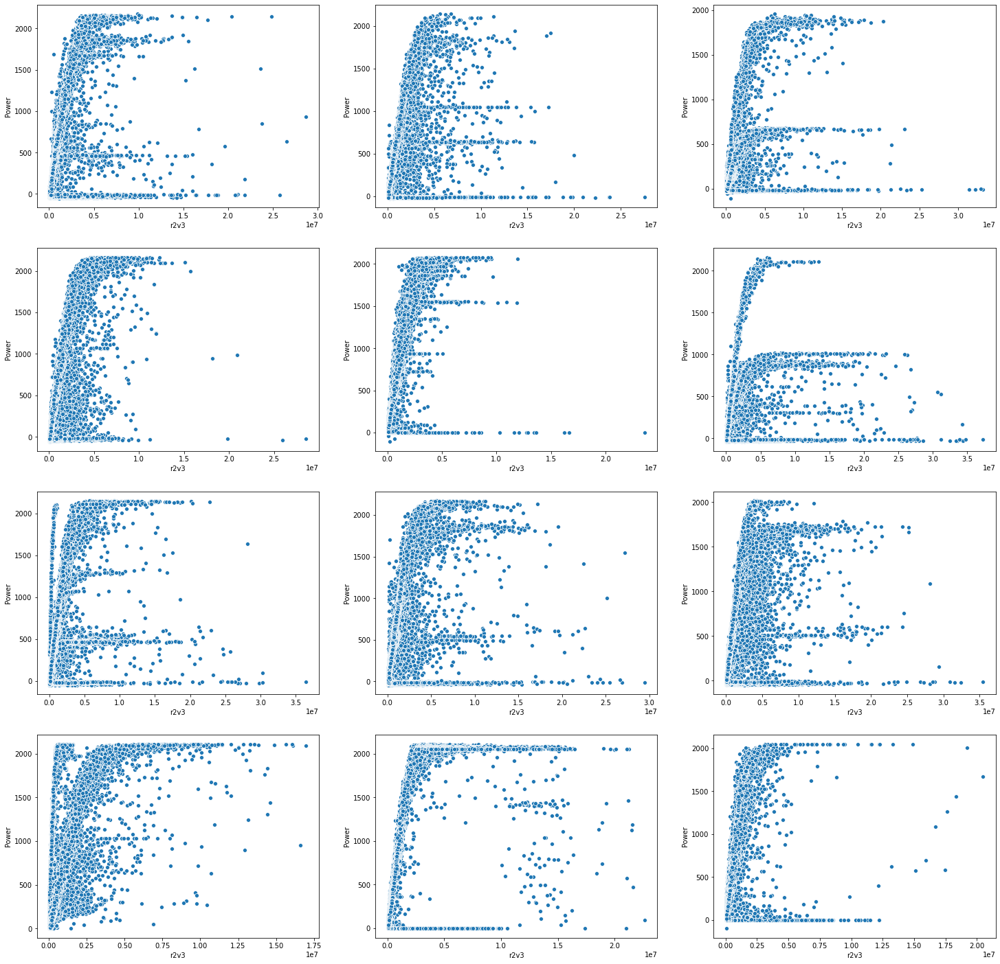

In [43]:
plt.figure(figsize=(25,25))
for i in range(1,13):
    plt.subplot(4,3,i)
    sns.scatterplot(x='r2v3',y='Power',data= data.loc[(data['WindNumber']==i)&(data['WindSpeed']>data['inSpeed'])&(data['WindSpeed']<data['outSpeed'])])


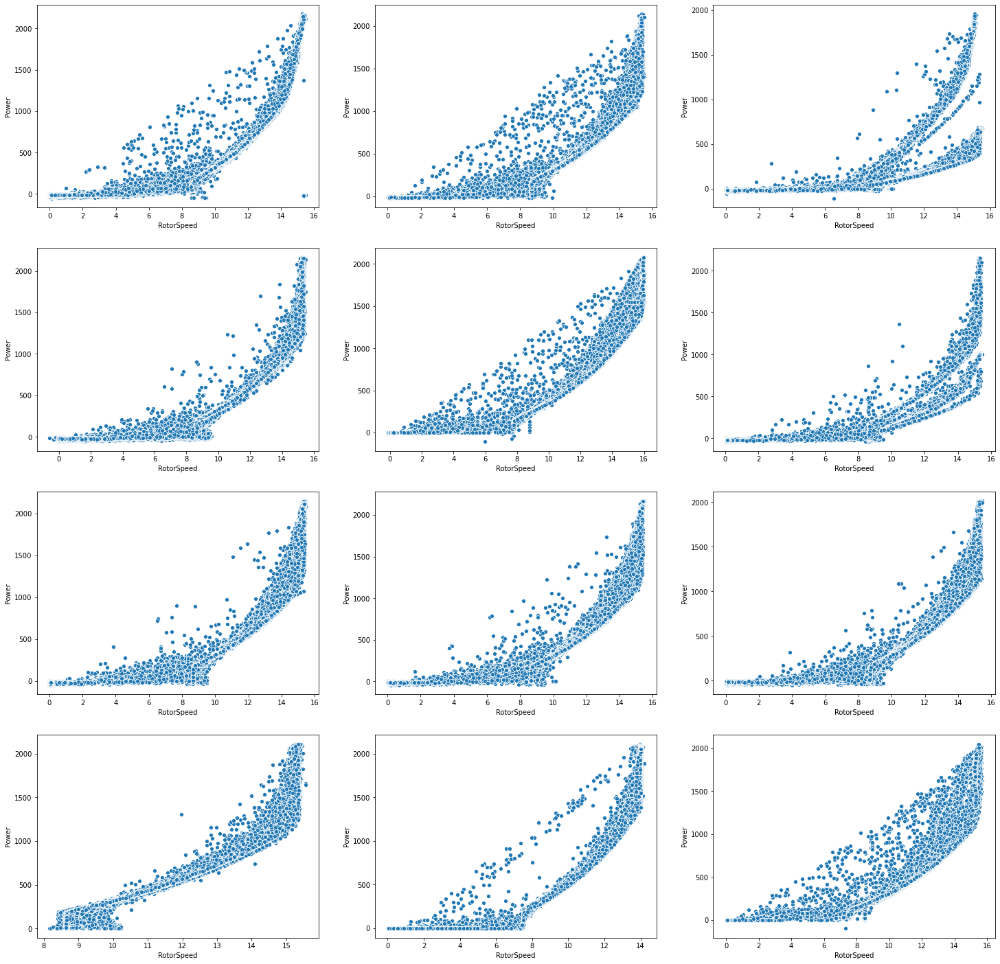

In [44]:
plt.figure(figsize=(25,25))
for i in range(1,13):
    plt.subplot(4,3,i)
    sns.scatterplot(x='RotorSpeed',y='Power',data= data.loc[(data['WindNumber']==i)&(data['WindSpeed']>data['inSpeed'])&(data['WindSpeed']<data['outSpeed'])])


In [17]:
np.meshgrid(np.linspace(-1,2,100),np.linspace(-1,2,100))

[array([[-1.        , -0.96969697, -0.93939394, ...,  1.93939394,
          1.96969697,  2.        ],
        [-1.        , -0.96969697, -0.93939394, ...,  1.93939394,
          1.96969697,  2.        ],
        [-1.        , -0.96969697, -0.93939394, ...,  1.93939394,
          1.96969697,  2.        ],
        ...,
        [-1.        , -0.96969697, -0.93939394, ...,  1.93939394,
          1.96969697,  2.        ],
        [-1.        , -0.96969697, -0.93939394, ...,  1.93939394,
          1.96969697,  2.        ],
        [-1.        , -0.96969697, -0.93939394, ...,  1.93939394,
          1.96969697,  2.        ]]),
 array([[-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ],
        [-0.96969697, -0.96969697, -0.96969697, ..., -0.96969697,
         -0.96969697, -0.96969697],
        [-0.93939394, -0.93939394, -0.93939394, ..., -0.93939394,
         -0.93939394, -0.93939394],
        ...,
        [ 1.93939394,  1.93939394,  1.93939394, ...,  

In [33]:
np.linspace(-1,2,100)

array([-1.        , -0.96969697, -0.93939394, -0.90909091, -0.87878788,
       -0.84848485, -0.81818182, -0.78787879, -0.75757576, -0.72727273,
       -0.6969697 , -0.66666667, -0.63636364, -0.60606061, -0.57575758,
       -0.54545455, -0.51515152, -0.48484848, -0.45454545, -0.42424242,
       -0.39393939, -0.36363636, -0.33333333, -0.3030303 , -0.27272727,
       -0.24242424, -0.21212121, -0.18181818, -0.15151515, -0.12121212,
       -0.09090909, -0.06060606, -0.03030303,  0.        ,  0.03030303,
        0.06060606,  0.09090909,  0.12121212,  0.15151515,  0.18181818,
        0.21212121,  0.24242424,  0.27272727,  0.3030303 ,  0.33333333,
        0.36363636,  0.39393939,  0.42424242,  0.45454545,  0.48484848,
        0.51515152,  0.54545455,  0.57575758,  0.60606061,  0.63636364,
        0.66666667,  0.6969697 ,  0.72727273,  0.75757576,  0.78787879,
        0.81818182,  0.84848485,  0.87878788,  0.90909091,  0.93939394,
        0.96969697,  1.        ,  1.03030303,  1.06060606,  1.09

In [30]:
Z[1]

array([-1.42547316, -1.40377112, -1.38239269, -1.36135311, -1.34066833,
       -1.32035503, -1.30043061, -1.28091323, -1.26182176, -1.24317585,
       -1.22499582, -1.20730272, -1.19011828, -1.17346484, -1.15736532,
       -1.14184315, -1.12692219, -1.11262663, -1.09898088, -1.08600942,
       -1.0737367 , -1.06220728, -1.05148437, -1.04144389, -1.03219567,
       -1.0237612 , -1.01616073, -1.0094131 , -1.00353551, -0.99854334,
       -0.99444991, -0.99124014, -0.9889216 , -0.9871133 , -0.98622169,
       -0.98621156, -0.98707875, -0.98889056, -0.99161591, -0.99525688,
       -0.99980345, -1.00524333, -1.01156212, -1.01874346, -1.02676926,
       -1.03561987, -1.04527436, -1.05571066, -1.06690583, -1.07883625,
       -1.09147781, -1.10480609, -1.11879656, -1.13342469, -1.14855388,
       -1.16414761, -1.18053178, -1.19335988, -1.20469441, -1.21797826,
       -1.22826895, -1.24009691, -1.25314165, -1.2667771 , -1.28098438,
       -1.29362059, -1.30565134, -1.31892151, -1.33180697, -1.34

In [44]:
df.shape

(35028, 3)

In [43]:
df=data.loc[(data['WindNumber']==1)&(data['WindSpeed']>3)&(data['WindSpeed']<25),['ScalePower','ScaleRotorSpeed','ScaleWindSpeed']]
clf=KNN(contamination=0.2)
clf.fit(df)

y_train_scores = clf.decision_scores_  # 返回训练数据上的异常值 (分值越大越异常)
y_train_pred = clf.labels_  # 返回训练数据上的分类标签 (0: 正常值, 1: 异常值)
np.mean(y_train_pred)

xx,yy=np.meshgrid(np.linspace(0,1,100),np.linspace(0,1,100))

Z=clf.decision_function(np.c_[xx.ravel(),yy.ravel()])*-1
Z=Z.reshape(xx.shape)

threshold=0.2
levels=np.linspace(Z.min(),threshold,10)
fig=plt.figure(figsize=(20,5))
ax=fig.add_subplot(111)
ax.contourf(xx,yy,Z,levels=levels,cmap=plt.cm.Blues_r)
ax.contour(xx,yy,Z,levels=[levels[-2]],linewidths=2,colors='red')
# plt.contour(xx,yy,Z,levels=[levels[-6],levels[-4]],colors='orange')
ax.scatter(df.loc[y_train_pred==1,'ScaleRotorSpeed'],df.loc[y_train_pred==1,'ScalePower'],c='white',s=20,edgecolors='y')
ax.scatter(df.loc[y_train_pred==0,'ScaleRotorSpeed'],df.loc[y_train_pred==0,'ScalePower'],c='white',s=20,edgecolors='k')

#ax.scatter(df[:,0],df[:,1])


ValueError: query data dimension must match training data dimension

<ipython-input-39-2723f1bc2fb7>:19: UserWarning: No contour levels were found within the data range.
  ax.contour(xx,yy,Z,levels=[levels[-2]],linewidths=2,colors='red')


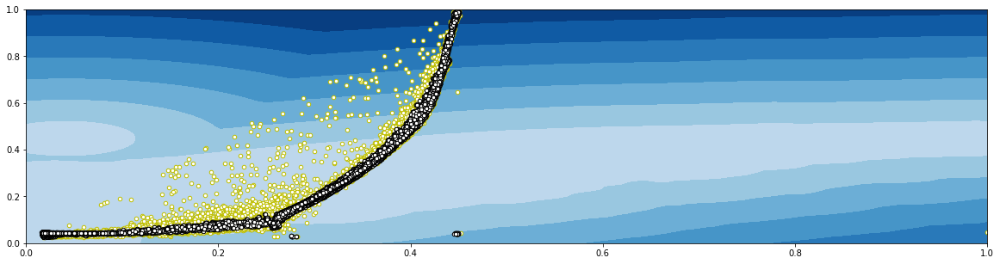

In [39]:
df=data.loc[(data['WindNumber']==1),['ScalePower','ScaleRotorSpeed']]
clf=KNN()
clf.fit(df)

y_train_scores = clf.decision_scores_  # 返回训练数据上的异常值 (分值越大越异常)
y_train_pred = clf.labels_  # 返回训练数据上的分类标签 (0: 正常值, 1: 异常值)
np.mean(y_train_pred)

xx,yy=np.meshgrid(np.linspace(0,1,100),np.linspace(0,1,100))

Z=clf.decision_function(np.c_[xx.ravel(),yy.ravel()])*-1
Z=Z.reshape(xx.shape)

threshold=0.2
levels=np.linspace(Z.min(),threshold,10)
fig=plt.figure(figsize=(20,5))
ax=fig.add_subplot(111)
ax.contourf(xx,yy,Z,levels=levels,cmap=plt.cm.Blues_r)
ax.contour(xx,yy,Z,levels=[levels[-2]],linewidths=2,colors='red')
# plt.contour(xx,yy,Z,levels=[levels[-6],levels[-4]],colors='orange')
ax.scatter(df.loc[y_train_pred==1,'ScaleRotorSpeed'],df.loc[y_train_pred==1,'ScalePower'],c='white',s=20,edgecolors='y')
ax.scatter(df.loc[y_train_pred==0,'ScaleRotorSpeed'],df.loc[y_train_pred==0,'ScalePower'],c='white',s=20,edgecolors='k')

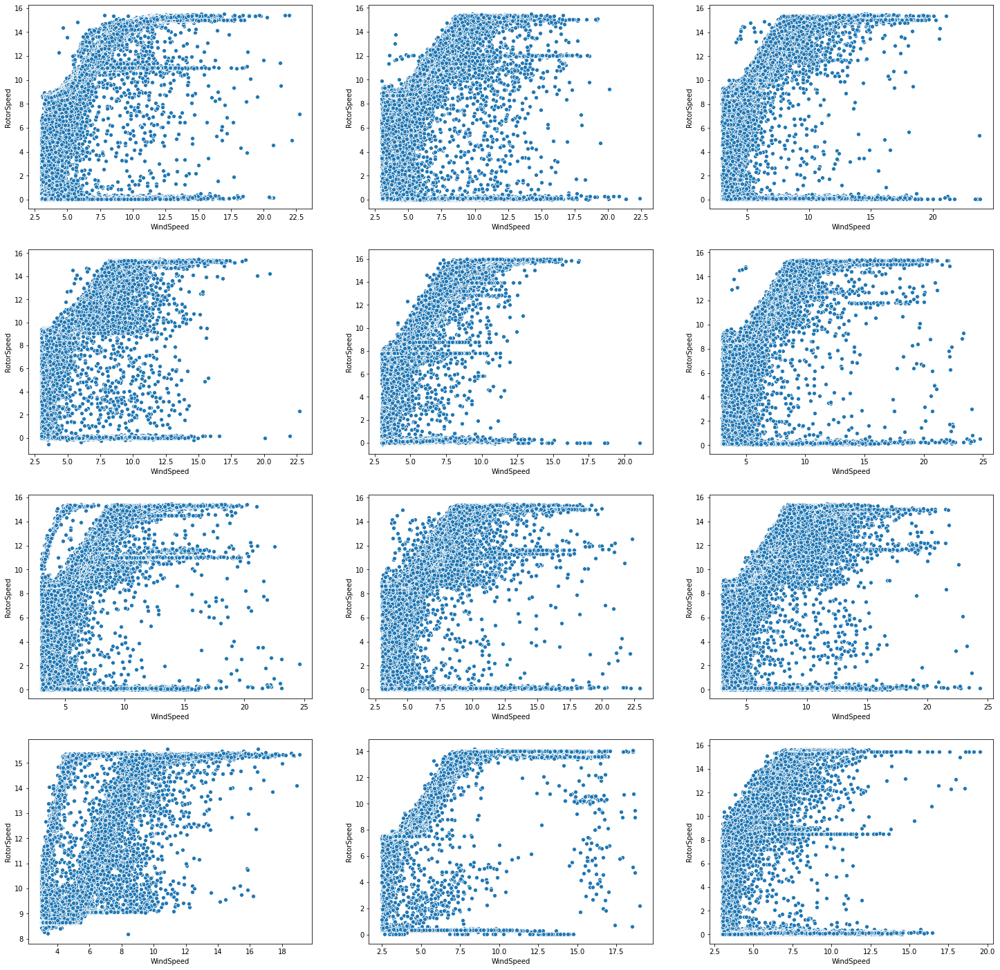

In [46]:
plt.figure(figsize=(25,25))
for i in range(1,13):
    plt.subplot(4,3,i)
    sns.scatterplot(x='WindSpeed',y='RotorSpeed',data= data.loc[(data['WindNumber']==i)&(data['WindSpeed']>data['inSpeed'])&(data['WindSpeed']<data['outSpeed'])])


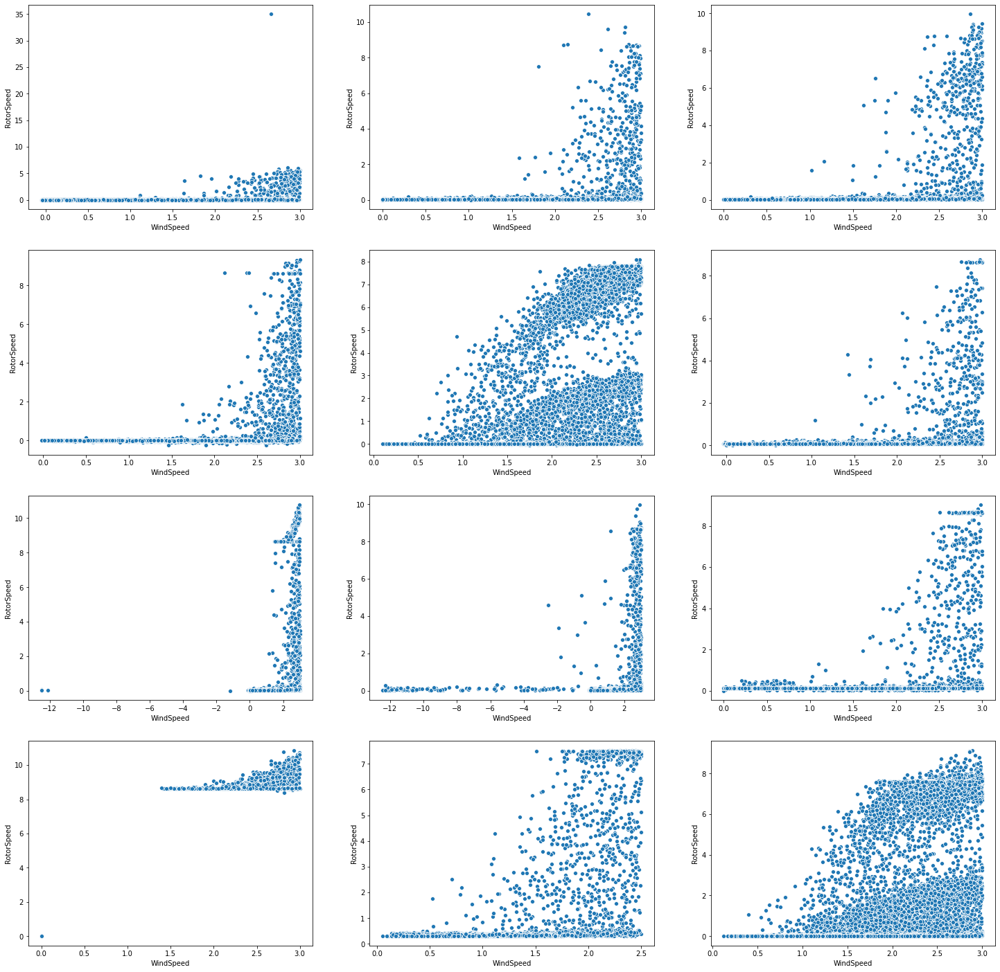

In [47]:
plt.figure(figsize=(25,25))
for i in range(1,13):
    plt.subplot(4,3,i)
    sns.scatterplot(x='WindSpeed',y='RotorSpeed',data= data.loc[(data['WindNumber']==i)&(data['WindSpeed']<data['inSpeed'])])


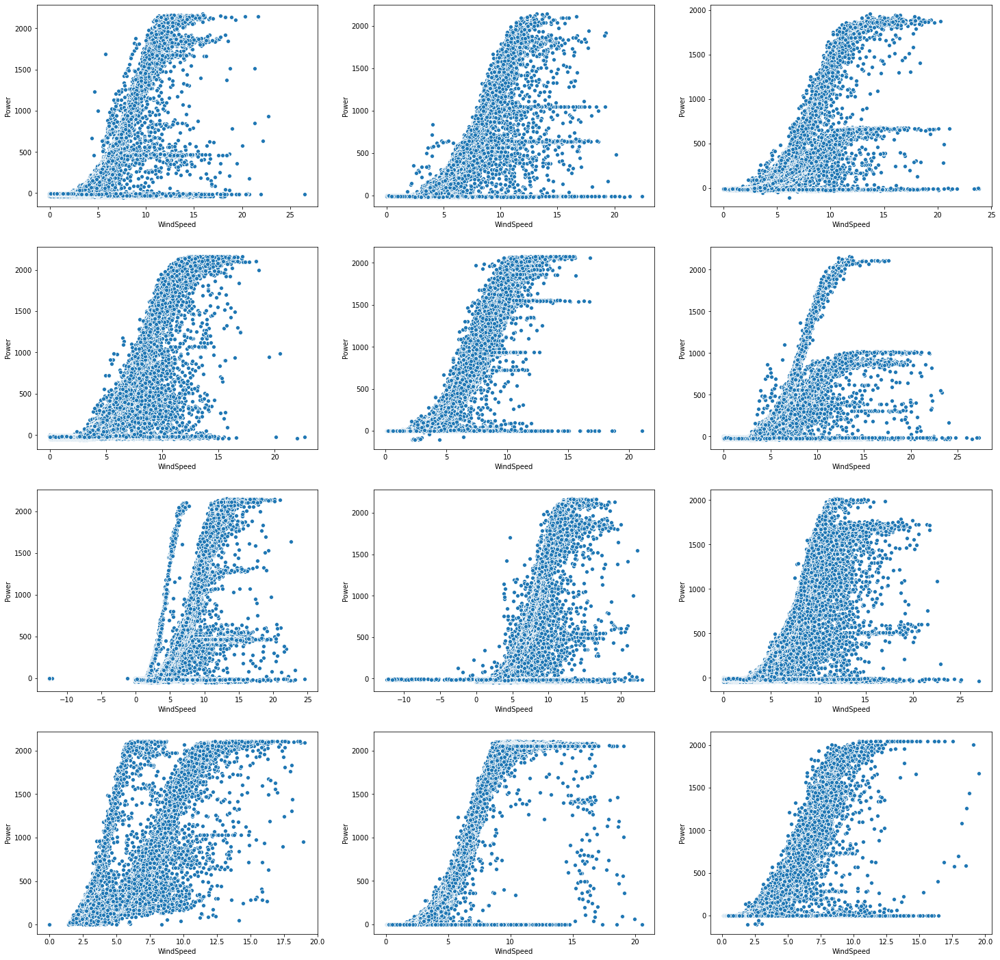

In [48]:
plt.figure(figsize=(25,25))
for i in range(1,13):
    plt.subplot(4,3,i)
    sns.scatterplot(x='WindSpeed',y='Power',data= data.loc[(data['WindNumber']==i)])


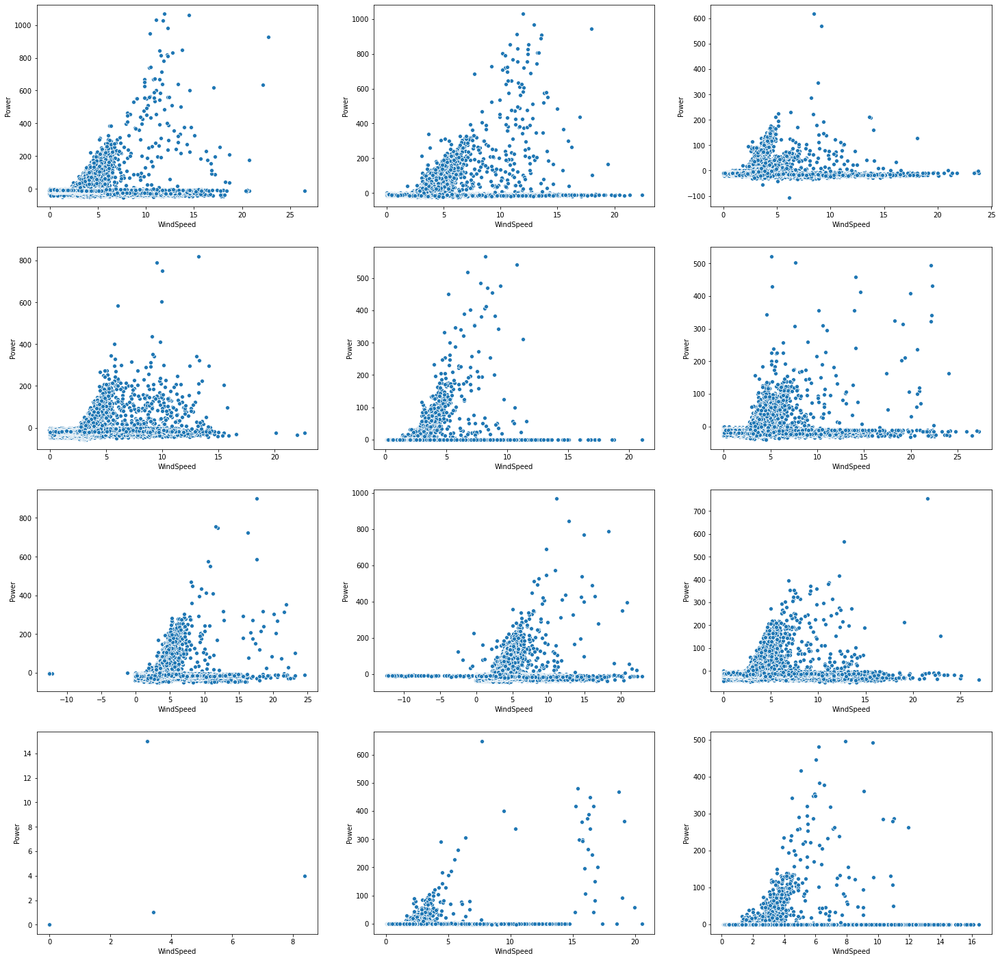

In [53]:
plt.figure(figsize=(25,25))
for i in range(1,13):
    plt.subplot(4,3,i)
    sns.scatterplot(x='WindSpeed',y='Power',data= data.loc[(data['WindNumber']==i)&(data['RotorSpeed']<data['floorRotor'])])

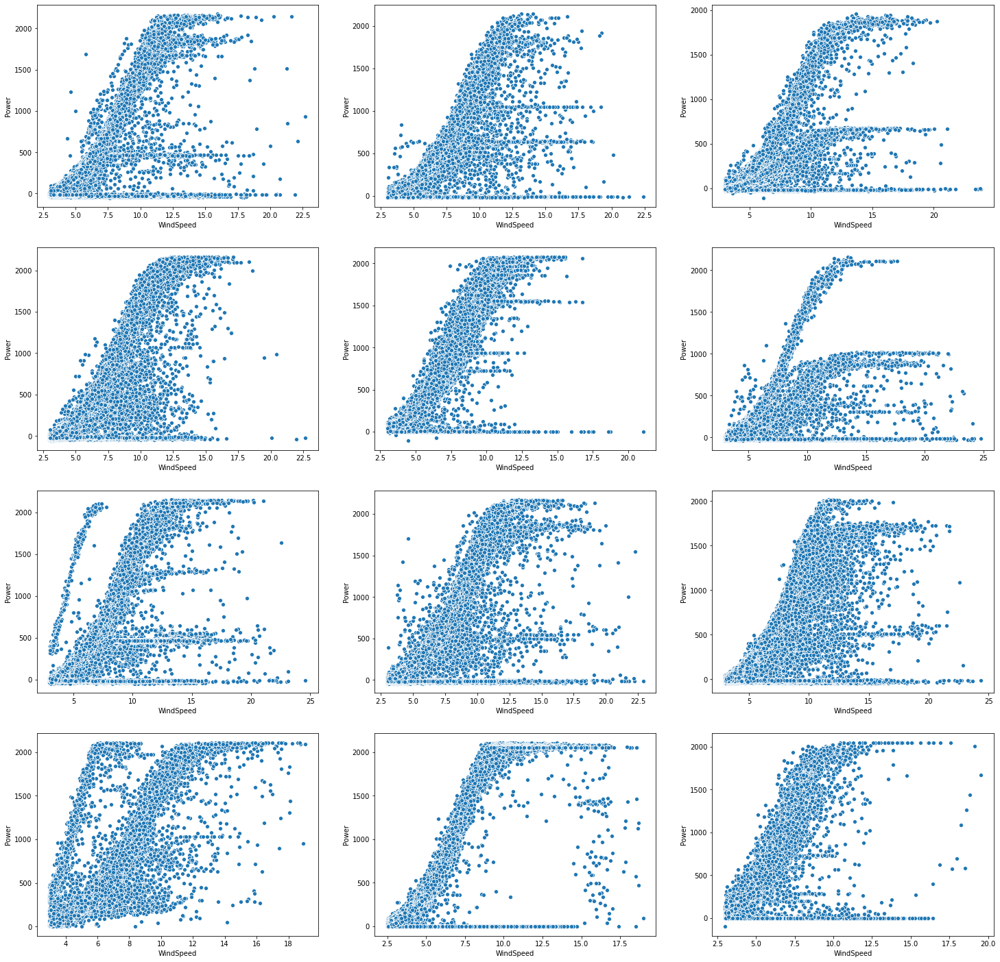

In [51]:
plt.figure(figsize=(25,25))
for i in range(1,13):
    plt.subplot(4,3,i)
    sns.scatterplot(x='WindSpeed',y='Power',data= data.loc[(data['WindNumber']==i)&(data['WindSpeed']>data['inSpeed'])&(data['WindSpeed']<data['outSpeed'])])

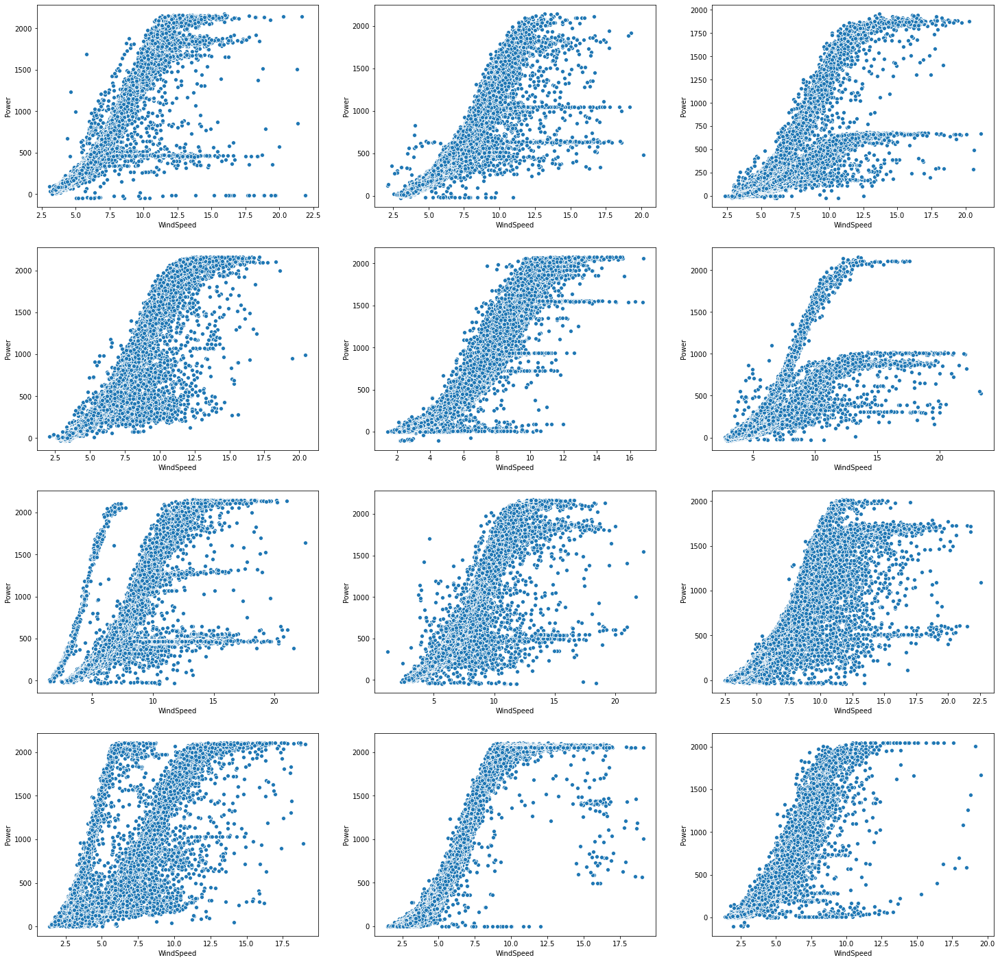

In [52]:
plt.figure(figsize=(25,25))
for i in range(1,13):
    plt.subplot(4,3,i)
    sns.scatterplot(x='WindSpeed',y='Power',data= data.loc[(data['WindNumber']==i)&(data['RotorSpeed']>data['floorRotor'])&(data['RotorSpeed']<data['ceilRotor'])])

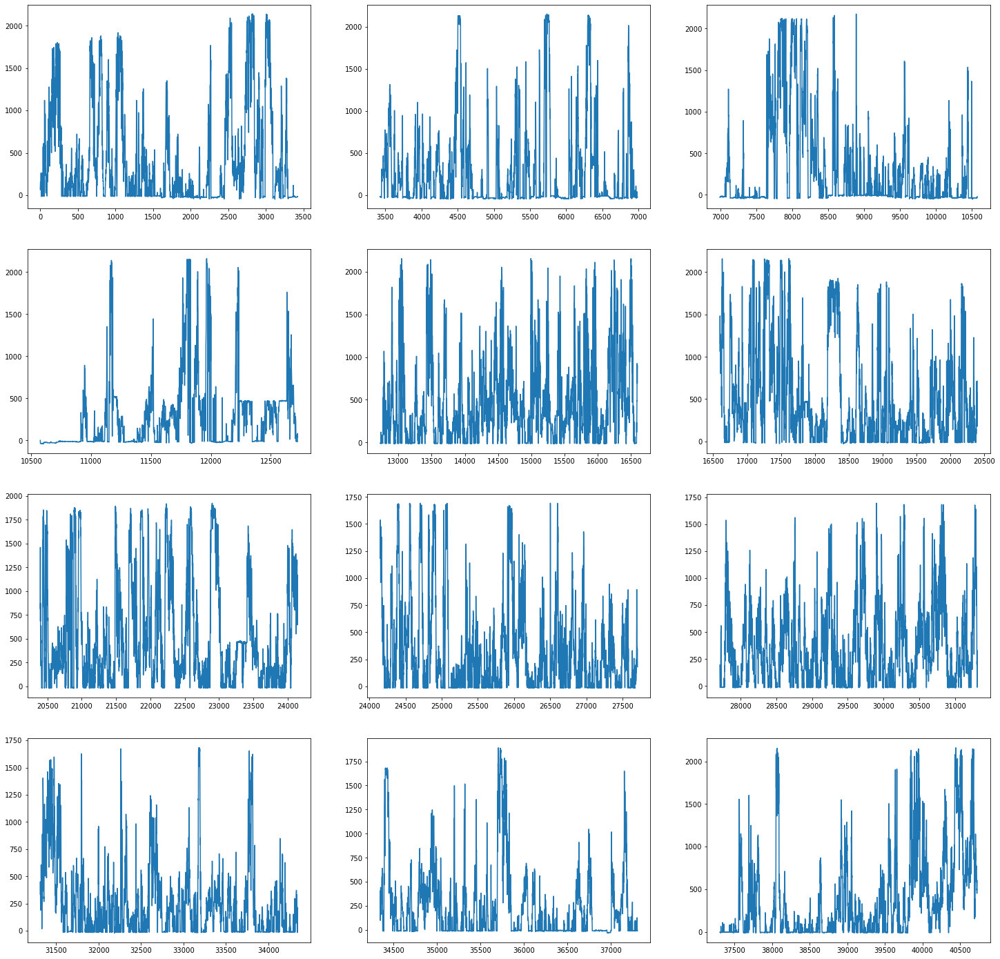

In [64]:
plt.figure(figsize=(25,25))
i = 0
for j in data.loc[(data['WindNumber']==1),'month'].unique():
    i += 1
    plt.subplot(4,3,i)
    data.loc[(data['WindNumber']==1)&(data['month']==j),'Power'].plot()


In [90]:
data.loc[(data['WindNumber']==2)&(data['Power']>0),'Power'].value_counts().head()
#data.loc[(data['WindNumber']==1)&(data['day_of_year']==56)].head(100)

636.00    18
638.00    11
636.95    10
16.00      9
636.60     9
Name: Power, dtype: int64

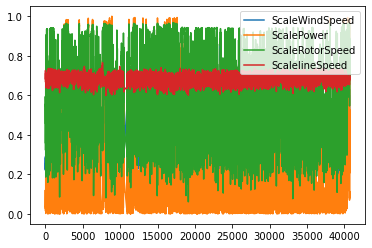

In [16]:
data_first.loc[(data_first['WindSpeed']>0)&(data_first['WindSpeed']<100),['ScaleWindSpeed','ScalePower','ScaleRotorSpeed','ScalelineSpeed']].plot()

In [18]:
sns.distplot(x='ScaleWindSpeed',y='ScalelineSpeed',data=data_first)

TypeError: distplot() got an unexpected keyword argument 'x'

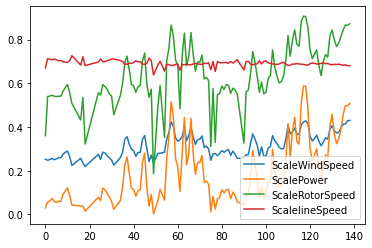

In [184]:
data_first.loc[data_first['day']==1,['ScaleWindSpeed','ScalePower','ScaleRotorSpeed','ScalelineSpeed']].plot()

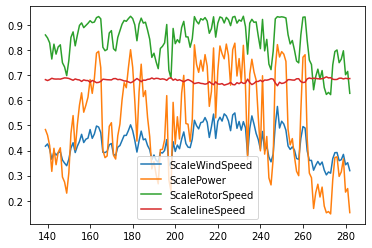

In [185]:
data_first.loc[data_first['day']==2,['ScaleWindSpeed','ScalePower','ScaleRotorSpeed','ScalelineSpeed']].plot()

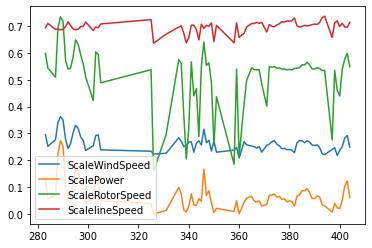

In [180]:
data_first.loc[data_first['day']==3,['ScaleWindSpeed','ScalePower','ScaleRotorSpeed','ScalelineSpeed']].plot()

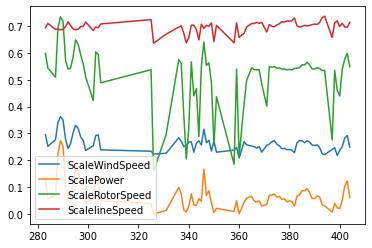

In [186]:
data_first.loc[data_first['day']==3,['ScaleWindSpeed','ScalePower','ScaleRotorSpeed','ScalelineSpeed']].plot()

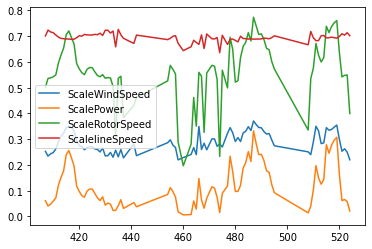

In [181]:
data_first.loc[data_first['day']==4,['ScaleWindSpeed','ScalePower','ScaleRotorSpeed','ScalelineSpeed']].plot()

In [240]:
print(data_first['ScalelineSpeed'].quantile(0.05))
print(data_first['ScalelineSpeed'].quantile(0.95))

0.6613009261025928
0.7126693320911512


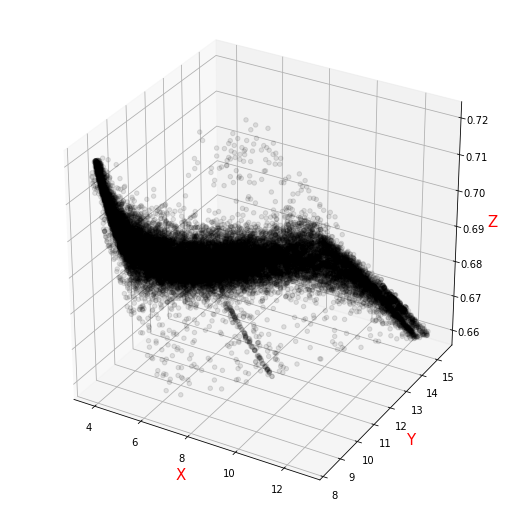

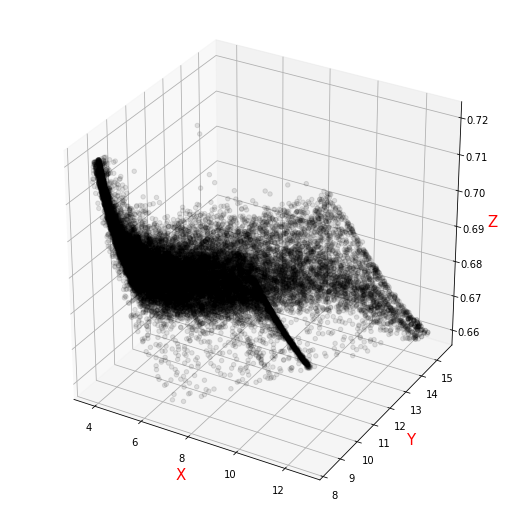

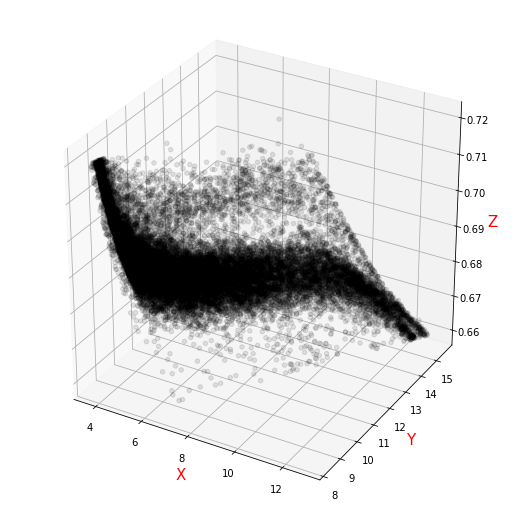

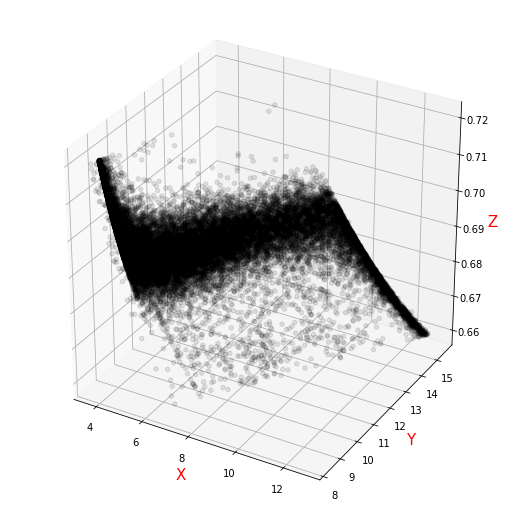

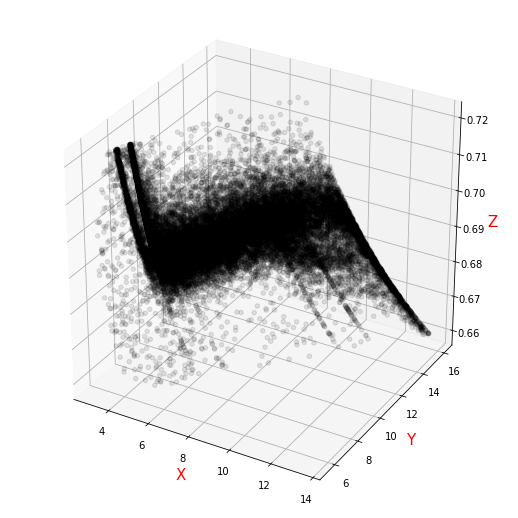

...

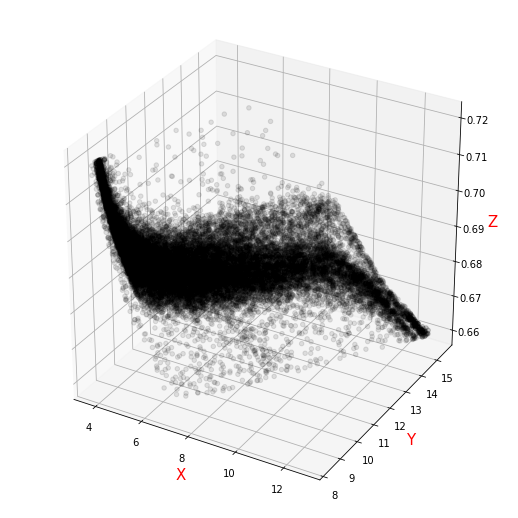

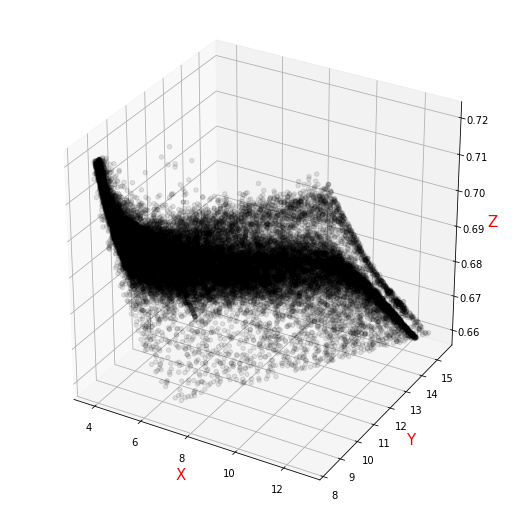

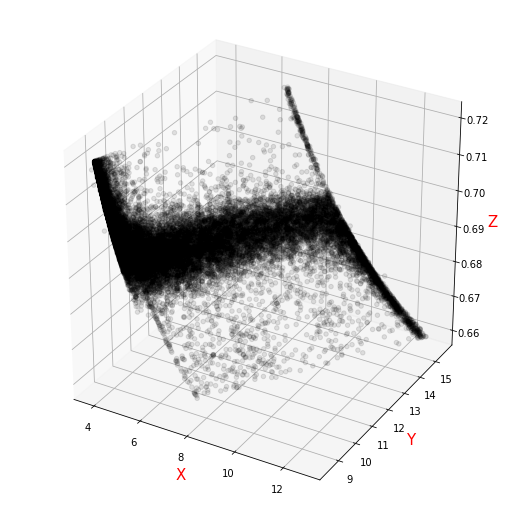

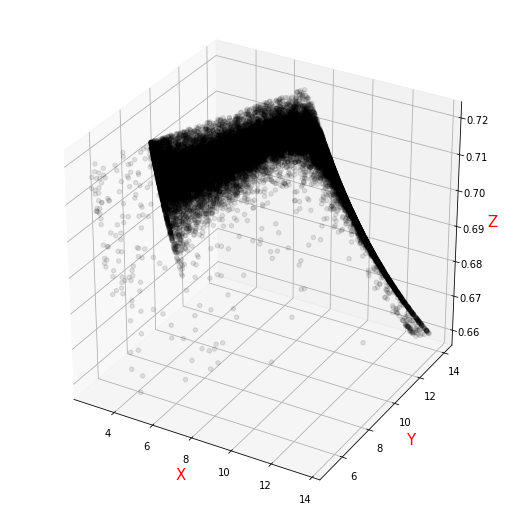

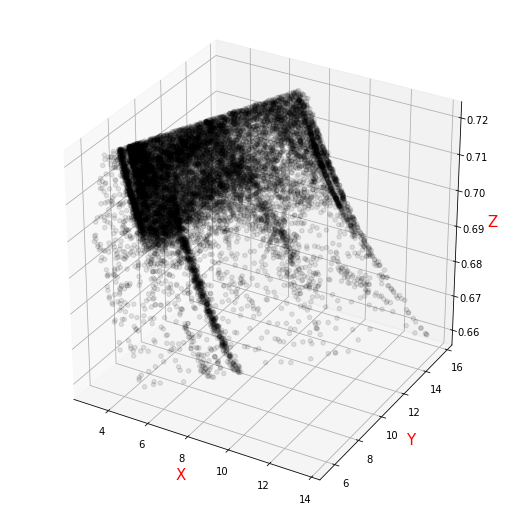

In [245]:
data_test = data.loc[(data['WindSpeed']>data['inSpeed'])&(data['WindSpeed']<data['outSpeed'])]
data_test = data_test.loc[(data['RotorSpeed']>data['floorRotor'])&(data['RotorSpeed']<data['ceilRotor'])]
data_test = data_test.loc[(data['Power']>0)]
data_test=data_test.loc[(data_test['ScalelineSpeed']>0.66)&(data_test['ScalelineSpeed']<0.72)]
for i in range(1,13):
    X = data_test.loc[(data_test['WindNumber']==i),['lineSpeed','WindSpeed','Power','RotorSpeed','ScalelineSpeed']]


    x_normal =  X['WindSpeed']
    y_normal =  X['RotorSpeed']
    z_normal =  X['ScalelineSpeed']



    fig = plt.figure(figsize=(7,7))
    sns.scatterplot(z_normal,y_normal)
    ax = Axes3D(fig)
    ax.scatter(x_normal, y_normal, z_normal,color='black',alpha=0.1)

    ax.set_zlabel('Z', fontdict={'size': 15, 'color': 'red'})
    ax.set_ylabel('Y', fontdict={'size': 15, 'color': 'red'})
    ax.set_xlabel('X', fontdict={'size': 15, 'color': 'red'})
    plt.show()

In [221]:
data.loc[(data['WindSpeed']>data['inSpeed'])&(data['WindSpeed']<data['outSpeed'])&(data['RotorSpeed']>data['floorRotor'])&(data['RotorSpeed']<data['ceilRotor'])]

,WindNumber,Time,WindSpeed,Power,RotorSpeed,date,hour,day_of_week,month,year,...,radius,floorRotor,ceilRotor,inSpeed,outSpeed,lineSpeed,ScaleWindSpeed,ScalePower,ScaleRotorSpeed,ScalelineSpeed
1,1,2017/11/1 0:30,4.042500,120.700000,8.636500,2017-11-01 00:30:00,0,2,11,2017,...,49.5,8.33,16.8,3.0,25.0,1.762551,0.247443,0.055509,0.539409,0.712176
2,1,2017/11/1 0:40,4.137368,135.157895,8.668421,2017-11-01 00:40:00,0,2,11,2017,...,49.5,8.33,16.8,3.0,25.0,1.728501,0.251007,0.062158,0.541405,0.709886
3,1,2017/11/1 0:50,4.274737,157.315789,8.727895,2017-11-01 00:50:00,0,2,11,2017,...,49.5,8.33,16.8,3.0,25.0,1.684434,0.256166,0.072348,0.545124,0.706922
4,1,2017/11/1 1:00,4.108947,129.894737,8.656842,2017-11-01 01:00:00,1,2,11,2017,...,49.5,8.33,16.8,3.0,25.0,1.738132,0.249939,0.059737,0.540681,0.710534
5,1,2017/11/1 1:10,4.223684,119.368421,8.630526,2017-11-01 01:10:00,1,2,11,2017,...,49.5,8.33,16.8,3.0,25.0,1.685776,0.254249,0.054896,0.539036,0.707013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497832,12,2019/12/31 23:00,7.054167,1097.633333,14.650750,2019-12-31 23:00:00,23,1,12,2019,...,52.4,5.50,17.0,3.0,22.0,1.813820,0.360557,0.504798,0.915476,0.715624
497833,12,2019/12/31 23:10,7.401833,1093.031667,14.823250,2019-12-31 23:10:00,23,1,12,2019,...,52.4,5.50,17.0,3.0,22.0,1.748977,0.373615,0.502682,0.926262,0.711263
497834,12,2019/12/31 23:20,7.754333,1217.640000,15.036750,2019-12-31 23:20:00,23,1,12,2019,...,52.4,5.50,17.0,3.0,22.0,1.693517,0.386854,0.559989,0.939612,0.707533
497835,12,2019/12/31 23:30,7.366667,1115.886667,14.817500,2019-12-31 23:30:00,23,1,12,2019,...,52.4,5.50,17.0,3.0,22.0,1.756645,0.372294,0.513193,0.925903,0.711779


In [80]:
train1.shape

(393245, 6)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



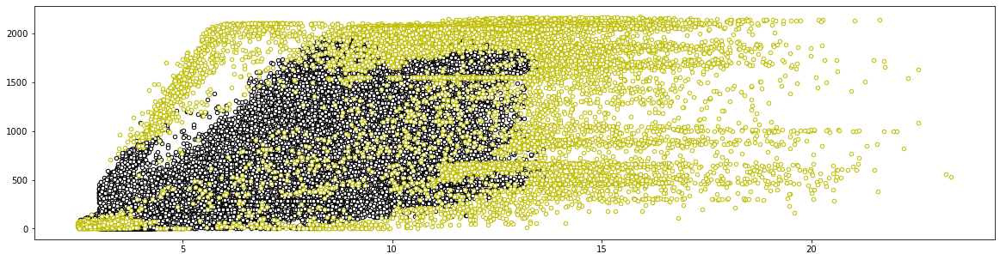

In [95]:
Sqr=dict()
Sqc=dict()
for i in range(1,13):
    Sqr[i]=3
    Sqc[i]=25
Sqr[11]=2.5
Sqc[11]=19
Sqc[5]=22
Sqc[12]=22
train0=pd.read_csv('dataset.csv')

train0['label']=None

inds_neg=[]
inds_neg+=list( train0.loc[(0>train0['WindSpeed'])|(train0['RotorSpeed']<0)|(train0['Power']<0),].index)
train1=train0.drop(inds_neg,axis=0)
train0.loc[inds_neg,'label']=1

inds0=[]
for i in range(1,13):
    inds0+=list( train1.loc[(Sqc[i]>=train1['WindSpeed'])&(train1['WindSpeed']>=Sqr[i])&(train1['WindNumber']==i),].index)
inds_ex=list(set(train1.index)-set(inds0))
train2=train1.loc[inds0]

train0.loc[inds_ex,'label']=1
#这样做会有0.1的提升


slow=dict()
sup=dict()
for i in range(1,13):
    slow[i]=8.33
    sup[i]=16.8
slow[5]=5.5
sup[5]=19
slow[11]=5
sup[11]=14
slow[12]=5.5
sup[12]=17


inds2=[]
for i in range(1,13):
    inds2+=list( train2.loc[(sup[i]>=train1['RotorSpeed'])&(train1['RotorSpeed']>=slow[i])&(train1['WindNumber']==i),].index)
inds_ex2=list(set(train2.index)-set(inds2))
train3=train1.loc[inds2]
train0.loc[inds_ex2,'label']=0

Rdict=dict()
Rdict[1]=99/2
Rdict[2]=99/2
Rdict[3]=99/2
Rdict[4]=99/2
Rdict[5]=100.5/2
Rdict[6]=99/2
Rdict[7]=99/2
Rdict[8]=99/2
Rdict[9]=99/2
Rdict[10]=99/2
Rdict[11]=115/2
Rdict[12]=104.8/2
train3['R']=train3['WindNumber']
for i in range(1,13):
    train3['R']=train3['R'].replace(i,Rdict[i])


#Power/WindSpeed
train3['PW']=train3['Power']/train3['WindSpeed']

#RotorSpeed/WindSpeed
train3['RW']=train3['RotorSpeed']/train3['WindSpeed']

#RotorSpeed/Power
train3['RP']=train3['Power']/train3['RotorSpeed']

# train3['k1']=train3['Power']/(train3['R']**2*train3['WindSpeed']**3)
train3['k1']=train3['Power']/(train3['R']**2*train3['WindSpeed']**3)

# train3['lambda']=train3['RotorSpeed']*train3['R']/train3['WindSpeed']**1
train3['lambda']=train3['RotorSpeed']*train3['R']/train3['WindSpeed']

# train3['k2']=train3['Power']/(train3['RotorSpeed']*train3['R'])
train3['k2']=train3['Power']/(train3['RotorSpeed']*train3['R'])

names=[ 'Power', 'WindSpeed','RotorSpeed', 'PW', 'RW','RP',  'k1', 'lambda', 'k2']


#clf=KNN()
clf = IForest(contamination=0.1,random_state=1)
df=train3[names]
clf.fit(df[['Power', 'WindSpeed','RotorSpeed']])
y_train_scores = clf.decision_scores_  # 返回训练数据上的异常值 (分值越大越异常)
y_train_pred = clf.labels_  # 返回训练数据上的分类标签 (0: 正常值, 1: 异常值)


alpha=0.05
q=np.quantile(y_train_scores,1-alpha)
y_train_pred[y_train_scores>q]=1
y_train_pred[y_train_scores<=q]=0
plt.figure(figsize=(20,5))

plt.scatter(df.loc[y_train_pred==0,'WindSpeed'],df.loc[y_train_pred==0,'Power'],c='white',s=20,edgecolors='k')
plt.scatter(df.loc[y_train_pred==1,'WindSpeed'],df.loc[y_train_pred==1,'Power'],c='white',s=20,edgecolors='y')


train0.loc[df.loc[y_train_pred==1].index,'label']=1
train0.loc[df.loc[y_train_pred==0].index,'label']=0

results=pd.DataFrame({'WindNumber':train0['WindNumber'],'Time':train0['Time'],'label':train0['label'].astype(int)})
results.to_csv('all7_results.csv',index=False)
print(results)
print(f'''异常值率：{np.mean(results['label'])}''')
# 0.82849844825 0.05

#0.82748156562 0.04

#0.82839484 0.06

#0.83513080 0.05  转速范围外的点设置为正常的结果











OUTLIERS :  13702 INLIERS :  27025


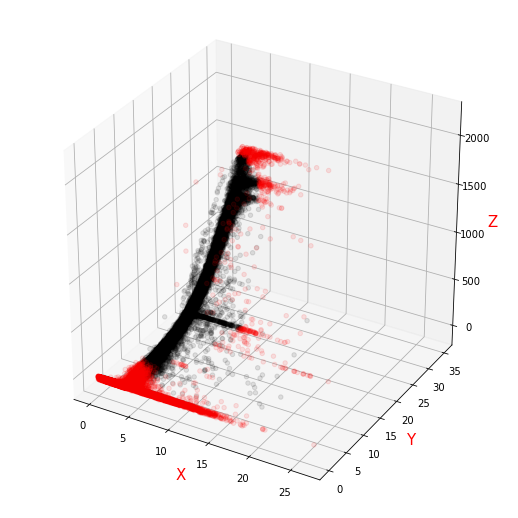

OUTLIERS :  12287 INLIERS :  26568


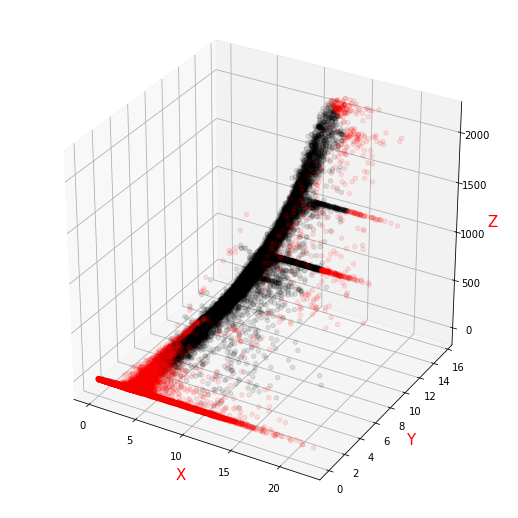

OUTLIERS :  12128 INLIERS :  26867


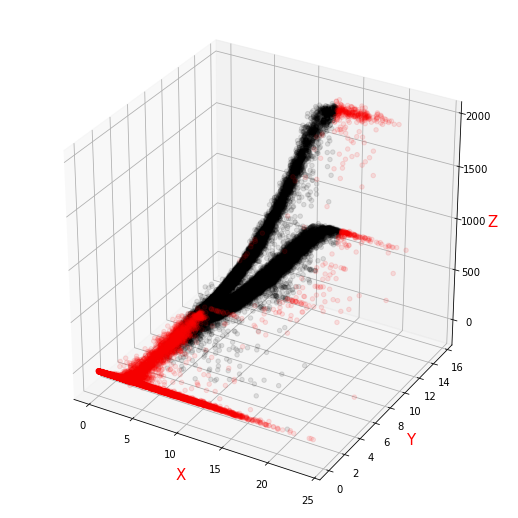

OUTLIERS :  13494 INLIERS :  30841


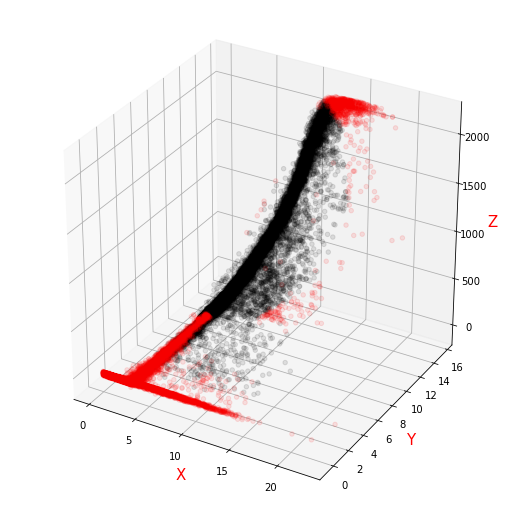

OUTLIERS :  20297 INLIERS :  30665


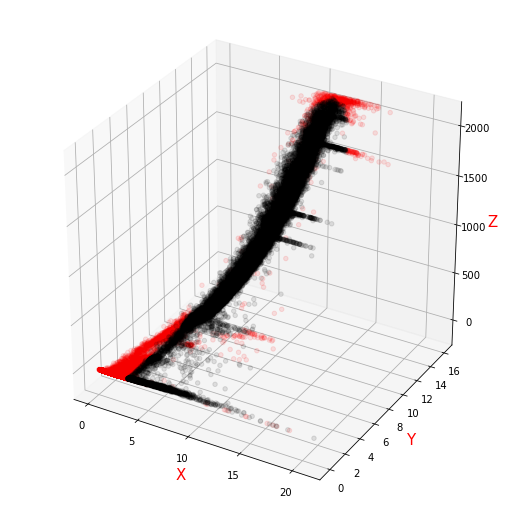

OUTLIERS :  16965 INLIERS :  28627


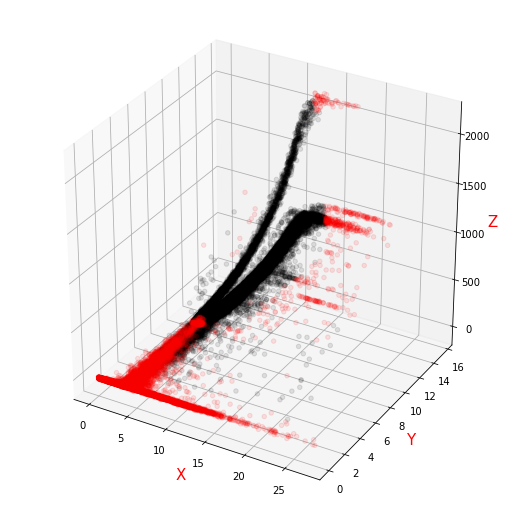

OUTLIERS :  15400 INLIERS :  27924


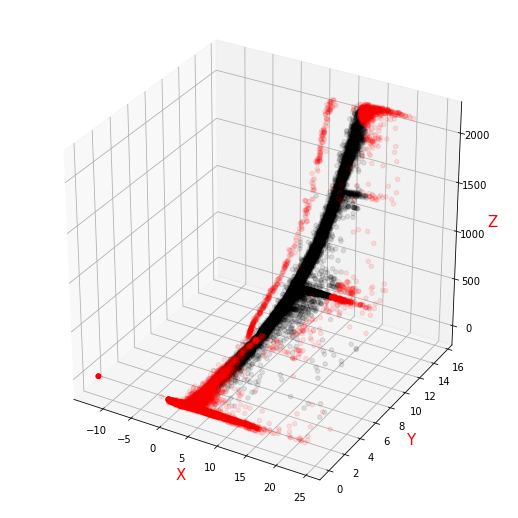

OUTLIERS :  10904 INLIERS :  27566


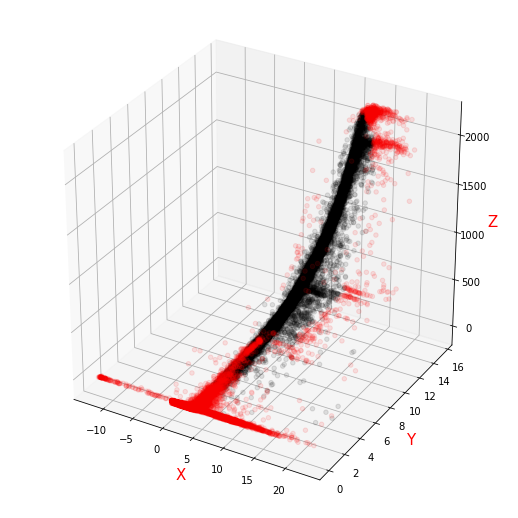

OUTLIERS :  12223 INLIERS :  30601


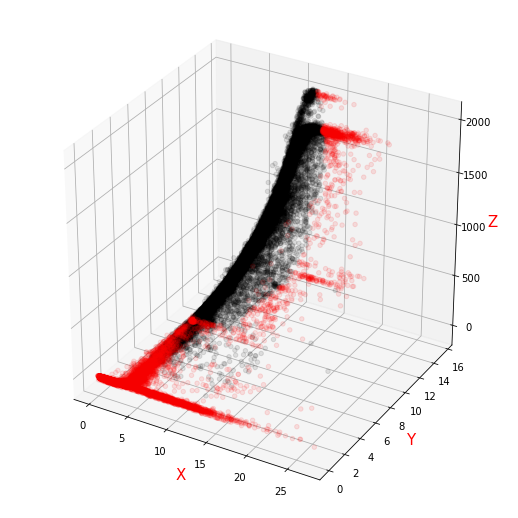

OUTLIERS :  3745 INLIERS :  26439


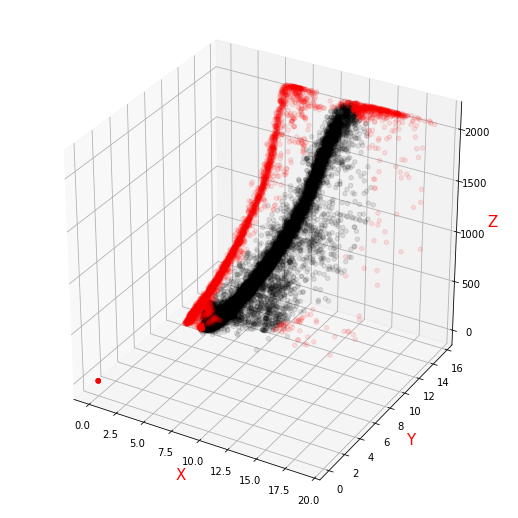

OUTLIERS :  9362 INLIERS :  27486


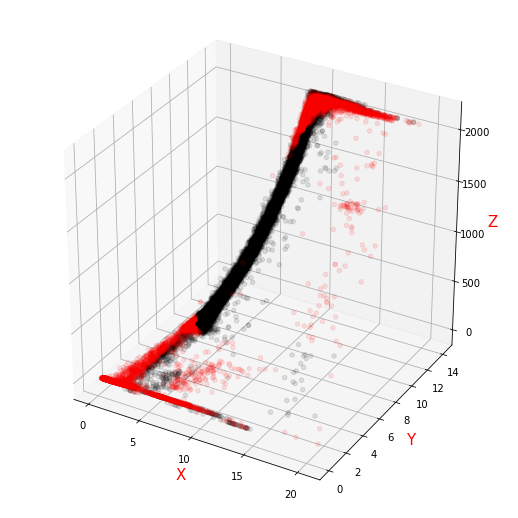

OUTLIERS :  22608 INLIERS :  24113


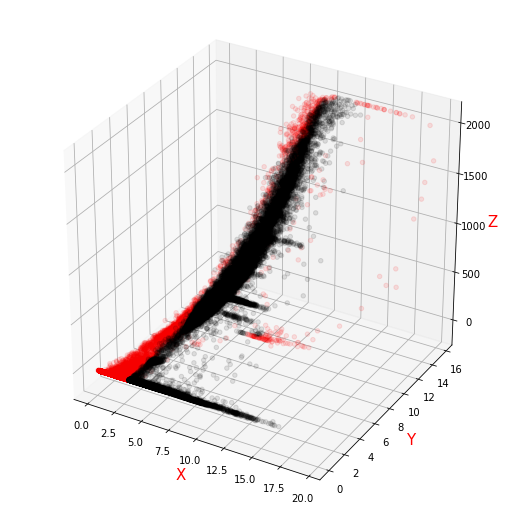

In [90]:
for i in range(1,13):
    X = train0.loc[(data['WindNumber']==i),['WindSpeed','Power','RotorSpeed','label']]


    x_normal =  X.loc[X['label']==0]['WindSpeed']
    y_normal =  X.loc[X['label']==0]['RotorSpeed']
    z_normal =  X.loc[X['label']==0]['Power']

    x_outlier =  X.loc[X['label']==1]['WindSpeed']
    y_outlier =  X.loc[X['label']==1]['RotorSpeed']
    z_outlier =  X.loc[X['label']==1]['Power']

    print('OUTLIERS : ',len(X.loc[X['label']==1]),'INLIERS : ',len(X.loc[X['label']==0]))


    fig = plt.figure(figsize=(7,7))
    sns.scatterplot(z_normal,y_normal)
    ax = Axes3D(fig)
    ax.scatter(x_normal, y_normal, z_normal,color='black',alpha=0.1)
    ax.scatter(x_outlier, y_outlier, z_outlier,color='red',alpha=0.1)

    ax.set_zlabel('Z', fontdict={'size': 15, 'color': 'red'})
    ax.set_ylabel('Y', fontdict={'size': 15, 'color': 'red'})
    ax.set_xlabel('X', fontdict={'size': 15, 'color': 'red'})
    plt.show()

OUTLIERS :  13390 INLIERS :  27337


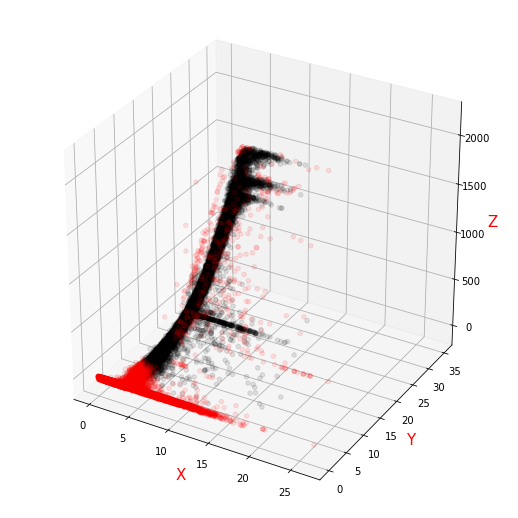

OUTLIERS :  12182 INLIERS :  26673


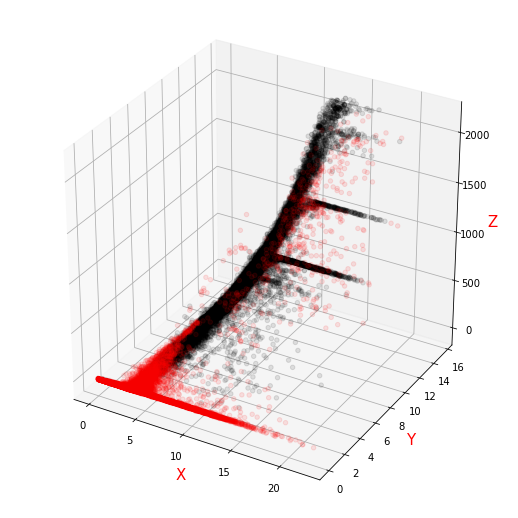

OUTLIERS :  12138 INLIERS :  26857


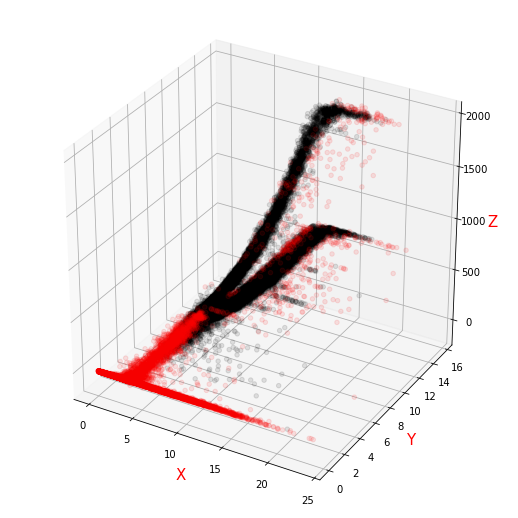

OUTLIERS :  13017 INLIERS :  31318


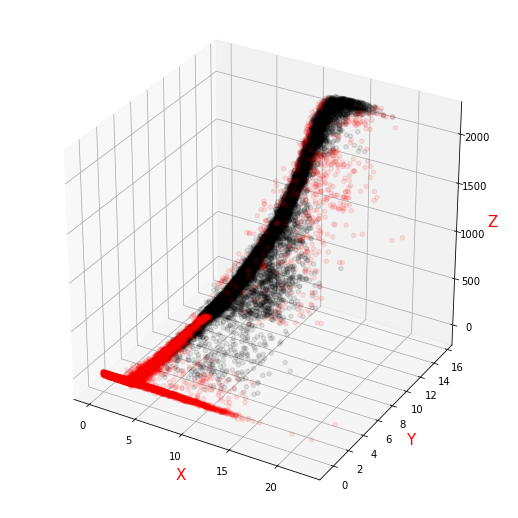

OUTLIERS :  22431 INLIERS :  28531


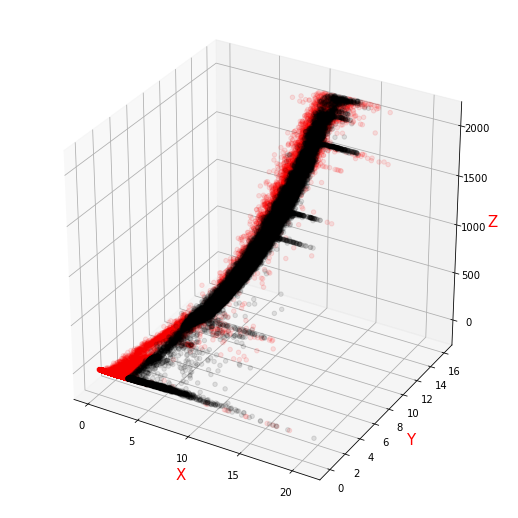

OUTLIERS :  17064 INLIERS :  28528


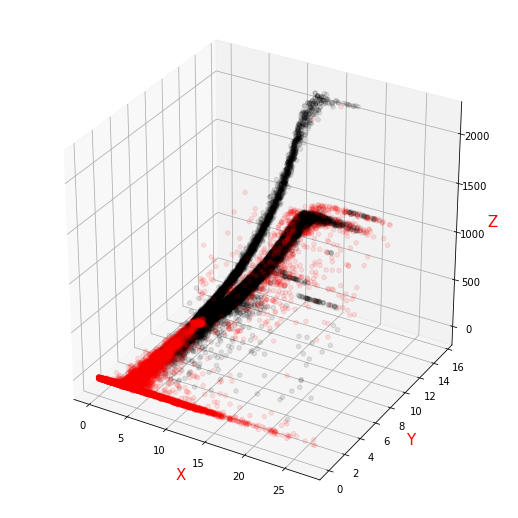

OUTLIERS :  14649 INLIERS :  28675


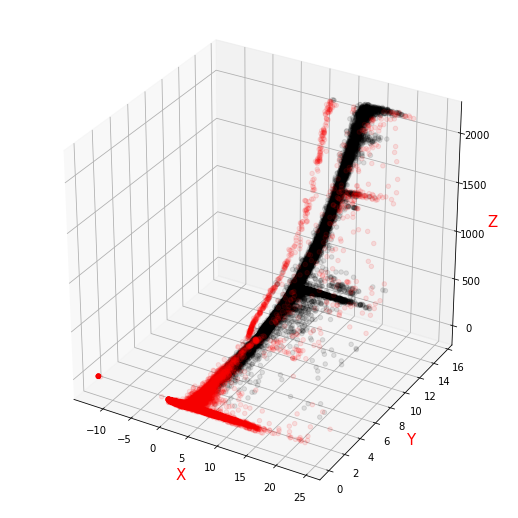

OUTLIERS :  10436 INLIERS :  28034


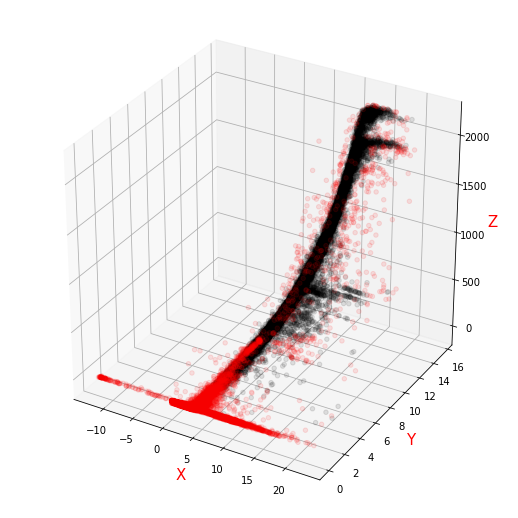

OUTLIERS :  12310 INLIERS :  30514


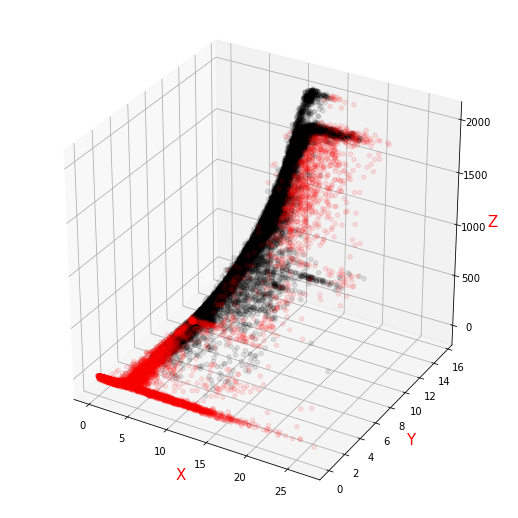

OUTLIERS :  3239 INLIERS :  26945


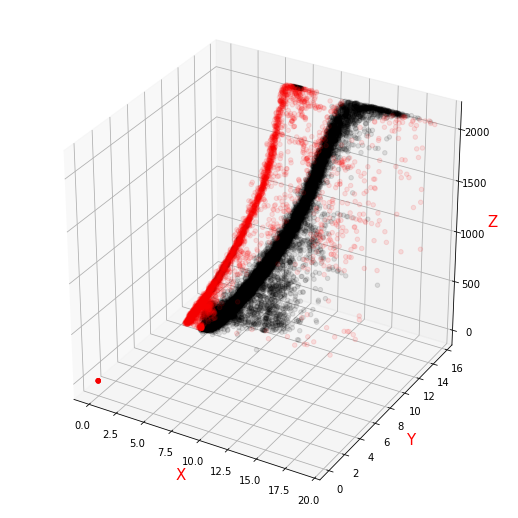

OUTLIERS :  6091 INLIERS :  30757


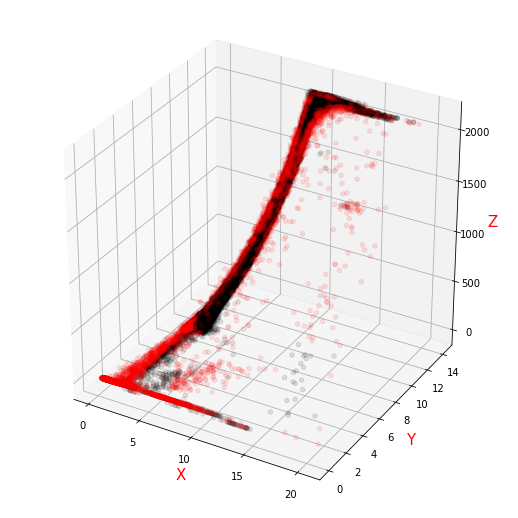

OUTLIERS :  26169 INLIERS :  20552


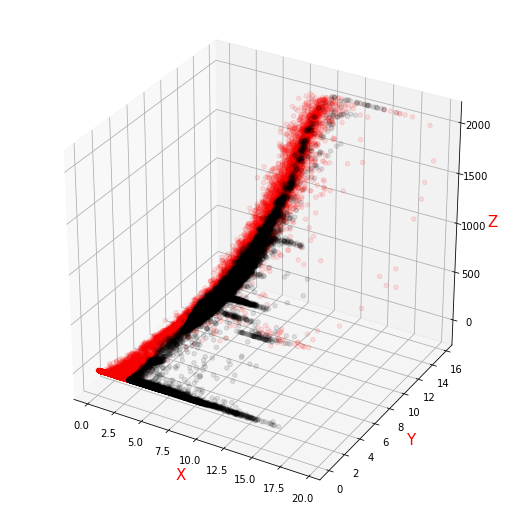

In [92]:
for i in range(1,13):
    X = train0.loc[(data['WindNumber']==i),['WindSpeed','Power','RotorSpeed','label']]


    x_normal =  X.loc[X['label']==0]['WindSpeed']
    y_normal =  X.loc[X['label']==0]['RotorSpeed']
    z_normal =  X.loc[X['label']==0]['Power']

    x_outlier =  X.loc[X['label']==1]['WindSpeed']
    y_outlier =  X.loc[X['label']==1]['RotorSpeed']
    z_outlier =  X.loc[X['label']==1]['Power']

    print('OUTLIERS : ',len(X.loc[X['label']==1]),'INLIERS : ',len(X.loc[X['label']==0]))


    fig = plt.figure(figsize=(7,7))
    sns.scatterplot(z_normal,y_normal)
    ax = Axes3D(fig)
    ax.scatter(x_normal, y_normal, z_normal,color='black',alpha=0.1)
    ax.scatter(x_outlier, y_outlier, z_outlier,color='red',alpha=0.1)

    ax.set_zlabel('Z', fontdict={'size': 15, 'color': 'red'})
    ax.set_ylabel('Y', fontdict={'size': 15, 'color': 'red'})
    ax.set_xlabel('X', fontdict={'size': 15, 'color': 'red'})
    plt.show()

In [87]:
train0['label'] = train0['label'].astype('int')

In [99]:
train0.loc[train0['WindNumber'].isin([1,2,3,4,6,7,8,9,10]),'radius'] = 99/2
train0.loc[train0['WindNumber'].isin([1,2,3,4,6,7,8,9,10]),'floorRotor'] = 8.33
train0.loc[train0['WindNumber'].isin([1,2,3,4,6,7,8,9,10]),'ceilRotor'] = 16.8
train0.loc[train0['WindNumber'].isin([1,2,3,4,6,7,8,9,10]),'inSpeed'] = 3
train0.loc[train0['WindNumber'].isin([1,2,3,4,6,7,8,9,10]),'outSpeed'] = 25
train0.loc[train0['WindNumber']==5,'radius'] = 100.5/2
train0.loc[train0['WindNumber']==5,'floorRotor'] = 5.5
train0.loc[train0['WindNumber']==5,'ceilRotor'] = 19
train0.loc[train0['WindNumber']==5,'inSpeed'] = 3
train0.loc[train0['WindNumber']==5,'outSpeed'] = 22
train0.loc[train0['WindNumber']==11,'radius'] = 115/2
train0.loc[train0['WindNumber']==11,'floorRotor'] = 5
train0.loc[train0['WindNumber']==11,'ceilRotor'] = 14
train0.loc[train0['WindNumber']==11,'inSpeed'] = 2.5
train0.loc[train0['WindNumber']==11,'outSpeed'] = 19
train0.loc[train0['WindNumber']==12,'radius'] = 104.8/2
train0.loc[train0['WindNumber']==12,'floorRotor'] = 5.5
train0.loc[train0['WindNumber']==12,'ceilRotor'] = 17
train0.loc[train0['WindNumber']==12,'inSpeed'] = 3
train0.loc[train0['WindNumber']==12,'outSpeed'] = 22

In [105]:
train0.loc[train0['RotorSpeed']>train0['floorRotor'],'label'].mean()

0.07244583367707674